<a href="https://colab.research.google.com/github/Simon-creator-jara/Inteligencia_artificial/blob/main/Copia_2_de_Pre_mapa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install osmnx

     |████████████████████████████████| 95 kB 2.2 MB/s 
     |████████████████████████████████| 1.0 MB 45.8 MB/s 
     |████████████████████████████████| 1.0 MB 46.6 MB/s 
     |████████████████████████████████| 63 kB 1.2 MB/s 
     |████████████████████████████████| 11.2 MB 18.5 MB/s 
     |████████████████████████████████| 6.3 MB 6.6 MB/s 
     |████████████████████████████████| 16.7 MB 46.4 MB/s 
     |████████████████████████████████| 900 kB 48.5 MB/s 
  Attempting uninstall: requests
    Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires reque

In [ ]:
!pip install plotly_express

In [ ]:
import pydot
from IPython.display import Image, display
import queue
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString

import matplotlib.pyplot as plt
import plotly_express as px

import networkx as nx
import osmnx as ox
import math

# **Mapa**

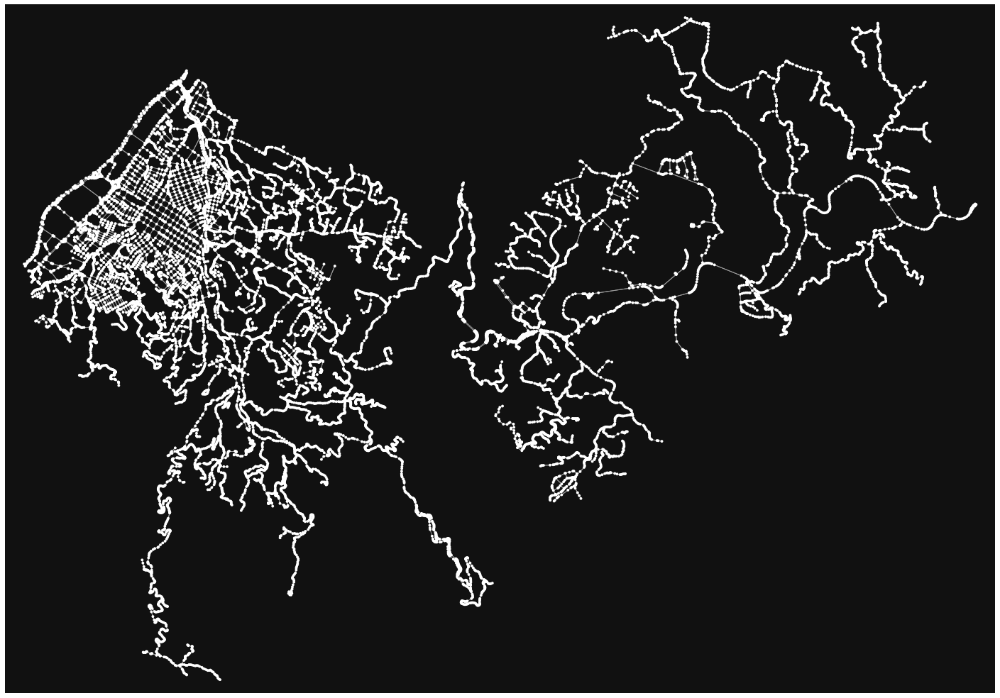

(<Figure size 1800x1800 with 1 Axes>, <AxesSubplot:>)

In [ ]:
G = ox.graph_from_place('Envigado, Antioquia, Colombia', network_type='drive',simplify=False)
ox.plot_graph(G,figsize=(25,25))

In [ ]:
hwy_speeds = {'residential': 35,
              'secondary': 50,
              'tertiary': 60}
G = ox.add_edge_speeds(G,hwy_speeds)              
G = ox.add_edge_travel_times(G)

In [ ]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

#**Programación Clases**

In [ ]:
class Node ():
  def __init__(self,state,value,operators,operator=None, parent=None,objective=None):
    self.state= state
    self.value = value
    self.children = []
    self.parent=parent
    self.operator=operator
    self.objective=objective
    self.level=0
    self.operators=operators

    
  def add_child(self, value, state, operator):
    node=type(self)(value=value, state=state, operator=operator,parent=self,operators=self.operators)
    node.level=node.parent.level+1
    self.children.append(node)
    return node
  
  def add_node_child(self, node):
    node.level=node.parent.level+1
    self.children.append(node)    
    return node

  #Devuelve todos los estados según los operadores aplicados
  def getchildrens(self):
    return [
        self.getState(i) 
          if not self.repeatStatePath(self.getState(i)) 
            else None for i, op in enumerate(self.operators)]
    
  def getState(self, index):
    pass
  
  def __eq__(self, other):
    return self.state == other.state
 
  def __lt__(self, other):
    return self.f() < other.f()

  def repeatStatePath(self, state):
      n=self
      while n is not None and n.state!=state:
          n=n.parent
      return n is not None
    
  def pathObjective(self):
      n=self
      result=[]
      while n is not None:
          result.append(n)
          n=n.parent
      return result
  
  def heuristic(self):
    return 0
  
  def cost(self):
    return 1
  
  def f(self): 
    print(self.cost()+self.heuristic())
    return self.cost()+self.heuristic()

In [ ]:
class Tree ():
  def __init__(self, root ,operators):
    self.root=root
    self.operators=operators

  def printPath(self,n):
    stack=n.pathObjective()
    path=stack.copy()
    while len(stack)!=0:
        node=stack.pop()
        if node.operator is not None:
            print(f'operador:  {self.operators[node.operator]} \t estado: {node.state}')
        else:
            print(f' {node.state}')
    return path

  def givePath(self,n):
    r=[]
    stack=n.pathObjective()
    path=stack.copy()
    while len(stack)!=0:
        node=stack.pop()
        if node.operator is not None:
            r.append(self.operators[node.operator])
    return r

  def reinitRoot(self):
    self.root.operator=None
    self.root.parent=None
    self.root.objective=None
    self.root.children = []
    self.root.level=0


  def bestFirst(self,endState):
    self.reinitRoot()
    pq=queue.PriorityQueue()
    pq.put((self.root.heuristic(),self.root))
    while not pq.empty():
      node=pq.get()[1]
      print(f"El nodo que entra a bestFirst es:{node}")
      children=node.getchildrens()
      print(f"Los hijos son:{children}")
      for i,child in enumerate(children):
        if child is not None:
          newChild=node.add_child(value=node.value+'-'+str(i), 
                                  state=child, operator=i)
          pq.put((newChild.heuristic(),newChild))
          if endState==child:
            return newChild

  ## A*
  def Aasterisk(self,endState):
    self.reinitRoot()
    pq=queue.PriorityQueue()
    pq.put((self.root.f(),self.root))
    while not pq.empty():
      node=pq.get()[1]
      children=node.getchildrens()
      for i,child in enumerate(children):
        if child is not None:
          newChild=node.add_child(value=node.value+'-'+str(i), 
                                  state=child, operator=i)
          #print(f"Hijo nuevo:{newChild.state}")
          pq.put((newChild.f(),newChild))
          if endState==child:
            return newChild
  
  ## Método para dibujar el árbol        
  def draw(self,path):
    graph = pydot.Dot(graph_type='graph')
    nodeGraph=pydot.Node(str(self.root.state)+"-"+str(0),
                          label=str(self.root.state),shape ="circle", 
                          style="filled", fillcolor="red")
    graph.add_node(nodeGraph)
    path.pop()
    return self.drawTreeRec(self.root,nodeGraph,graph,0,path.pop(),path)
  ## Método recursivo para dibujar el árbol  
  def drawTreeRec(self,r,rootGraph,graph,i,topPath,path):
    if r is not None:
      children=r.children
      for j,child in enumerate(children):
        i=i+1
        color="white"
        if topPath.value==child.value:
          if len(path)>0:topPath=path.pop()
          color='red'
        c=pydot.Node(child.value,label=str(child.state)+r"\n"+r"\n"+"f="+str(child.f()), 
                      shape ="circle", style="filled", 
                      fillcolor=color)
        graph.add_node(c)
        graph.add_edge(pydot.Edge(rootGraph, c, 
                                  label=str(child.operator)+'('+str(child.cost())+')'))
        graph=self.drawTreeRec(child,c,graph,i,topPath,path)  # recursive call
      return graph
    else:
      return graph 

In [58]:
class RouteMap(Node):
  #Definiendo mapa como una variable static
  mapa=None
  #Definiendo la distancia aérea como una variable static
  endState=None
  #distancias=[]
  x_inicial=None
  y_inicial=None
  x_final=None
  y_final=None
  edge_final=None
  d_init=None
  edges=None
  df_edges=None
  name_final=None
  highway_final=None
  oneway_final=None
  lanes_final=None
  speed_kph=None
  def __init__(self,mapa=None,initState=None,endState=None,**kwargs):
    super(RouteMap, self).__init__(**kwargs)
    if mapa is not None:
      RouteMap.mapa=mapa
    if endState is not None:
      RouteMap.endState=endState

    if initState is not None:
      RouteMap.initState=initState


    if self.parent is not None:
      self.parentcost=self.parent.cost()
    if RouteMap.edges is None and RouteMap.df_edges is None:
      RouteMap.edges=list(RouteMap.mapa.edges)    
    if RouteMap.mapa is not None and RouteMap.df_edges is None:
      RouteMap.df_edges = ox.graph_to_gdfs(RouteMap.mapa)[1]

    self.adj=self.adj()
    if RouteMap.x_inicial is None:
      RouteMap.x_inicial=RouteMap.mapa.nodes[self.initState]['x']

    if RouteMap.y_inicial is None:
      RouteMap.y_inicial=RouteMap.mapa.nodes[self.initState]['y']

    if RouteMap.x_final is None:    
      RouteMap.x_final=RouteMap.mapa.nodes[self.endState]['x']

    if RouteMap.y_final is None:  
      RouteMap.y_final=RouteMap.mapa.nodes[self.endState]['y']

    if RouteMap.edge_final is None:  
      RouteMap.edge_final=ox.distance.nearest_edges(RouteMap.mapa, RouteMap.x_final,RouteMap.y_final)
    if RouteMap.d_init is None:  
      RouteMap.d_init=ox.distance.euclidean_dist_vec( RouteMap.y_inicial , RouteMap.x_inicial , RouteMap.y_final , RouteMap.x_final ) 

    if RouteMap.name_final is None:  
      try:
        RouteMap.name_final=  RouteMap.mapa.edges[RouteMap.edge_final]['name']
      except:
        RouteMap.name_final=0
    if RouteMap.highway_final is None:  
      try:
        RouteMap.highway_final=RouteMap.mapa.edges[RouteMap.edge_final]['highway']
      except:
        RouteMap.highway_final=0
    if RouteMap.oneway_final is None:  
      try:
        RouteMap.oneway_final=RouteMap.mapa.edges[RouteMap.edge_final]['oneway']
      except:
        RouteMap.oneway_final=0
    if RouteMap.lanes_final is None:  
      try:
        RouteMap.lanes_final= int(RouteMap.mapa.edges[RouteMap.edge_final]['lanes'])
      except:
        RouteMap.lanes_final=0

    if RouteMap.speed_kph is None:  
      try:
        RouteMap.speed_kph=RouteMap.mapa.edges[RouteMap.edge_final]['speed_kph']
      except:
        RouteMap.speed_kph=0
 



  def adj(self):
    state=self.state
    edges=RouteMap.edges
    nodes=[]
    for i in range(len(edges)):
      if edges[i][0]==self.state:
        nodes.append(edges[i][1])
    result=[a if not self.repeatStatePath(a) else None for a in nodes]

    return result
          
  def getState(self, index): 
    if len(self.adj)>0:
        for node in self.adj:
            if (self.operators[index]==node):

                return self.operators[index]          
    return None
  
  def cost(self):
    if self.parent is not None:

      for a in self.parent.adj:
        if a==self.state:
          cost=self.parentcost+RouteMap.df_edges.loc[self.parent.state,self.state,0]['travel_time']
          print(f"tiempo de viaje:{RouteMap.df_edges.loc[self.parent.state,self.state,0]['travel_time']}")
    else:
      cost=0
    print(f"El costo es:{cost}")
    return cost
  
  def heuristic(self):
    print(f"State heuristica:{self.state}")
    x=RouteMap.mapa.nodes[self.state]['x']
    y=RouteMap.mapa.nodes[self.state]['y']

    d=ox.distance.euclidean_dist_vec( y , x , RouteMap.y_final , RouteMap.x_final )

    if d> RouteMap.d_init :
      result=d+10
    else:
      result=d

    if self.parent is not None:

      name = RouteMap.df_edges.loc[self.parent.state,self.state,0]['name']

    if self.parent is not None:

      highway = RouteMap.df_edges.loc[self.parent.state,self.state,0]['highway']

    if self.parent is not None: 

      oneway = RouteMap.df_edges.loc[self.parent.state,self.state,0]['oneway']

    if self.parent is not None:

      lanes = RouteMap.df_edges.loc[self.parent.state,self.state,0]['lanes']

    if self.parent is not None:
 
      speed = RouteMap.df_edges.loc[self.parent.state,self.state,0]['speed_kph']


    if RouteMap.name_final !=0 and self.parent is not None:
      print(name)
      print(RouteMap.name_final)
      if name == RouteMap.name_final:
        sum_name=0
      else:
        sum_name=8
    else:
      sum_name=0



    if RouteMap.highway_final !=0 and self.parent is not None:
      print(highway)
      print(RouteMap.highway_final)
      if highway == RouteMap.highway_final:
        sum_highway=0
      else:
        sum_highway=6
    else:
      sum_highway=0


    if RouteMap.oneway_final !=0 and self.parent is not None:
      print(oneway)
      print(RouteMap.oneway_final)
      if oneway == RouteMap.oneway_final:
        sum_oneway=0
      else:
        sum_oneway=5
    else:
      sum_oneway=0

      

    if RouteMap.lanes_final !=0 and self.parent is not None:
      print(lanes)
      print(RouteMap.lanes_final)
      if lanes == RouteMap.lanes_final:
        sum_lanes=0
      else:
        sum_lanes=4
    else:
      sum_lanes=0


    if RouteMap.speed_kph !=0 and self.parent is not None:
      print(speed)
      print(RouteMap.speed_kph)
      if speed == RouteMap.speed_kph:
        sum_speed=0
      else:
        sum_speed=2
    else:
      sum_speed=0

    if len(self.adj)==1:
      sum_adj=0
    elif len(self.adj)==2:
      sum_adj=2
    elif len(self.adj)>2:
      sum_adj=6
    else:
      sum_adj=0
    

    print(sum_speed,sum_adj,sum_highway,sum_lanes,sum_oneway,sum_speed,sum_name)
    if self.parent is not None:
      result=result+sum_name+sum_highway+sum_oneway+sum_lanes+sum_speed+sum_adj
    else:
      result=result+sum_adj
    
    print(result)
    return result

In [81]:
start=(6.179532, -75.579589)
#estestart=(6.165878, -75.579705)
#start=(6.179533, -75.579651)
#end= (6.181510, -75.575569)
#end= (6.178702, -75.578437)
#end= (6.15696005, -75.51685480358233)
#end=(6.178702, -75.578797)
#estesiempreend=(6.181805, -75.574734)
end=(6.173766, -75.566328)
#esteend=(6.165551, -75.578706)
start_node = ox.distance.nearest_nodes(G, start[1],start[0]) 
end_node = ox.distance.nearest_nodes(G, end[1],end[0])

In [82]:
nodes=list(G.nodes)
operators=nodes

In [83]:
node_1=RouteMap(mapa=G, initState=start_node,endState=end_node,value="inicio",state=start_node, operators= operators)
routeEIA=Tree(node_1,operators)

In [ ]:
objective=routeEIA.bestFirst(end_node)

In [84]:
objective=routeEIA.Aasterisk(end_node)

Se han truncado las últimas 5000 líneas del flujo de salida.
El costo es:127.20000000000002
State heuristica:9397808501
Transversal 27A Sur
Transversal 32C Sur
residential
residential
nan
2
40.0
35.0
2 0 0 4 0 2 8
14.001635997872855
tiempo de viaje:0.4
El costo es:123.49999999999999
tiempo de viaje:0.6
El costo es:124.09999999999998
State heuristica:9005216311
Diagonal 29
Transversal 32C Sur
residential
residential
nan
2
35.0
35.0
0 2 0 4 0 0 8
14.002404443989777
138.10240444398977
tiempo de viaje:0.6
El costo es:124.09999999999998
State heuristica:9005216311
Diagonal 29
Transversal 32C Sur
residential
residential
nan
2
35.0
35.0
0 2 0 4 0 0 8
14.002404443989777
tiempo de viaje:0.8
El costo es:121.49999999999999
tiempo de viaje:1.0
El costo es:122.49999999999999
State heuristica:7411106032
Diagonal 29
Transversal 32C Sur
residential
residential
2
2
35.0
35.0
0 2 0 4 0 0 8
14.0027585897629
136.5027585897629
tiempo de viaje:1.0
El costo es:122.49999999999999
State heuristica:7411106032
D

KeyboardInterrupt: ignored

In [66]:
result=routeEIA.givePath(objective)

In [67]:
path=routeEIA.printPath(objective)

 8458050797
operador:  4321952286 	 estado: 4321952286
operador:  340686061 	 estado: 340686061
operador:  4404924416 	 estado: 4404924416
operador:  5532256386 	 estado: 5532256386
operador:  340686746 	 estado: 340686746
operador:  4404924419 	 estado: 4404924419
operador:  4404924420 	 estado: 4404924420
operador:  340686060 	 estado: 340686060
operador:  4404924418 	 estado: 4404924418
operador:  4404924417 	 estado: 4404924417
operador:  3648101524 	 estado: 3648101524
operador:  340686059 	 estado: 340686059
operador:  4404924394 	 estado: 4404924394
operador:  3648101523 	 estado: 3648101523
operador:  3648101522 	 estado: 3648101522
operador:  4404924400 	 estado: 4404924400
operador:  4404924399 	 estado: 4404924399
operador:  4404924397 	 estado: 4404924397
operador:  4404924395 	 estado: 4404924395
operador:  3648102739 	 estado: 3648102739
operador:  3648102740 	 estado: 3648102740
operador:  338172930 	 estado: 338172930
operador:  3648102733 	 estado: 3648102733
operador:

In [ ]:
graph=routeEIA.draw(path.copy())
tree_image = Image(graph.create_png(), width=9000, height=7000)
display(tree_image)

Streaming output truncated to the last 5000 lines.
30.0
35.0
30.006538646025746
timepo de viaje:9.9
El costo es:58.8
timepo de viaje:8.6
El costo es:67.39999999999999
State heuristica:9254854300
Calle 21 Sur
Transversal 32C Sur
tertiary
residential
2
2
30.0
35.0
30.006701794706643
97.40670179470663
timepo de viaje:8.6
El costo es:67.39999999999999
State heuristica:9254854300
Calle 21 Sur
Transversal 32C Sur
tertiary
residential
2
2
30.0
35.0
30.006701794706643
timepo de viaje:8.6
El costo es:67.39999999999999
timepo de viaje:1.1
El costo es:59.9
State heuristica:9395406287
Carrera 41AA
Transversal 32C Sur
residential
residential
nan
2
30.0
35.0
24.0066197082262
83.9066197082262
timepo de viaje:1.1
El costo es:59.9
State heuristica:9395406287
Carrera 41AA
Transversal 32C Sur
residential
residential
nan
2
30.0
35.0
24.0066197082262
timepo de viaje:1.1
El costo es:59.9
timepo de viaje:0.4
El costo es:31.6
State heuristica:9395276464
nan
Transversal 32C Sur
tertiary_link
residential
1
2
50

In [68]:
node_start = []
node_end = []
X_to = []
Y_to = []
X_from = []
Y_from = []
length = []
travel_time = []

for u, v in zip(result[:-1], result[1:]):
    node_start.append(u)
    node_end.append(v)
    length.append(round(G.edges[(u, v, 0)]['length']))
    travel_time.append(round(G.edges[(u, v, 0)]['travel_time']))
    X_from.append(G.nodes[u]['x'])
    Y_from.append(G.nodes[u]['y'])
    X_to.append(G.nodes[v]['x'])
    Y_to.append(G.nodes[v]['y'])

In [69]:
df = pd.DataFrame(list(zip(node_start, node_end, X_from, Y_from,  X_to, Y_to, length, travel_time)), 
               columns =["node_start", "node_end", "X_from", "Y_from",  "X_to", "Y_to", "length", "travel_time"]) 
df.head()

,node_start,node_end,X_from,Y_from,X_to,Y_to,length,travel_time
0,4321952286,340686061,-75.579362,6.179430,-75.579293,6.179411,8,1
1,340686061,4404924416,-75.579293,6.179411,-75.579207,6.179403,10,1
2,4404924416,5532256386,-75.579207,6.179403,-75.579115,6.179400,10,1
3,5532256386,340686746,-75.579115,6.179400,-75.578987,6.179407,14,1
4,340686746,4404924419,-75.578987,6.179407,-75.578899,6.179419,10,1


In [70]:
df.reset_index(inplace=True)
df.head()

,index,node_start,node_end,X_from,Y_from,X_to,Y_to,length,travel_time
0,0,4321952286,340686061,-75.579362,6.179430,-75.579293,6.179411,8,1
1,1,340686061,4404924416,-75.579293,6.179411,-75.579207,6.179403,10,1
2,2,4404924416,5532256386,-75.579207,6.179403,-75.579115,6.179400,10,1
3,3,5532256386,340686746,-75.579115,6.179400,-75.578987,6.179407,14,1
4,4,340686746,4404924419,-75.578987,6.179407,-75.578899,6.179419,10,1


In [71]:
df

,index,node_start,node_end,X_from,Y_from,X_to,Y_to,length,travel_time
0,0,4321952286,340686061,-75.579362,6.179430,-75.579293,6.179411,8,1
1,1,340686061,4404924416,-75.579293,6.179411,-75.579207,6.179403,10,1
2,2,4404924416,5532256386,-75.579207,6.179403,-75.579115,6.179400,10,1
3,3,5532256386,340686746,-75.579115,6.179400,-75.578987,6.179407,14,1
4,4,340686746,4404924419,-75.578987,6.179407,-75.578899,6.179419,10,1
...,...,...,...,...,...,...,...,...,...
77,77,340682852,6819378702,-75.570656,6.178233,-75.570449,6.178123,26,2
78,78,6819378702,9375364056,-75.570449,6.178123,-75.570301,6.178563,52,5
79,79,9375364056,9375364057,-75.570301,6.178563,-75.570284,6.178585,3,0
80,80,9375364057,9375364055,-75.570284,6.178585,-75.570254,6.178594,3,0


In [72]:
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.X_from, df.Y_from))
gdf["geometry_to"] = [Point(xy) for xy in zip(gdf.X_to, gdf.Y_to)]
gdf['line'] = gdf.apply(lambda row: LineString([row['geometry_to'], row['geometry']]), axis=1)
line_gdf = gdf[["node_start","node_end","length","travel_time", "line"]].set_geometry('line')

/usr/local/lib/python3.7/dist-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



In [73]:
px.scatter_mapbox(gdf, lon= "X_from", lat="Y_from", zoom=12,mapbox_style='stamen-terrain')

In [74]:
route_graph_map = ox.plot_route_folium(G, result,popup_attribute='name', edge_width=2) 
route_graph_map.save('route.html')

In [75]:
display(route_graph_map)

In [76]:
fig = px.scatter_mapbox(gdf, lon= "X_from", lat="Y_from", width=800, height=400, zoom=12,mapbox_style='open-street-map')
fig.add_trace(px.line_mapbox(gdf, lon= "X_from", lat="Y_from").data[0])

In [77]:
route_length = int(sum(ox.utils_graph.get_route_edge_attributes(G, result, 'length')))
route_time = int(sum(ox.utils_graph.get_route_edge_attributes(G, result, 'travel_time')))
print('Ruta tiene', route_length, 'metros y toma', route_time, 'segundos.')

Ruta tiene 1228 metros y toma 88 segundos.
